## Natural Language Processing (ft. Spotify) 
Carthage Guest Lecture

Benjamin Burch

2024-04-03

Before you start, create a Kaggle account at kaggle.com to download the Spotify data set

Create an API key at https://www.kaggle.com/settings

Place the downloaded kaggle.json file in C:/Users/\<windows user name\>/.kaggle

Set up your Python environment

```
py -m venv ./env
env/Scripts/activate
py -m pip install -U pip wheel setuptools
py -m pip install ipykernel gensim nltk spacy seaborn plotly pandas bertopic kaggle
python -m spacy download en_core_web_lg
```
Download the Spotify Million Song data set https://www.kaggle.com/datasets/notshrirang/spotify-million-song-dataset/data

``` !kaggle datasets download -d notshrirang/spotify-million-song-dataset```

Make sure to unzip spotify-million-song-dataset.zip into your project folder

# What is Natural Language Processing?

<div>
<img src="./figures/nlp.png" width="800"/>
</div>

# Your task for today

<div>
<img src="./figures/spotify.jfif" width="800"/>
</div>

In [2]:
# python sys libraries
import os
import re
import pickle
import itertools
from collections import Counter
from datetime import datetime
import time

#standard DS libraries
import numpy as np
import pandas as pd

#nlp libraries
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords 
import gensim.models as w2v
from openai import AzureOpenAI #need API key
import openai

#plotting libraries
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px

#topic modeling
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import OpenAI
from sklearn.feature_extraction.text import CountVectorizer

#set environment variables
from dotenv import load_dotenv
_=load_dotenv()

In [3]:
pd.options.display.float_format = '{:,.2f}'.format #put commas in pandas numbers

nltk.download('wordnet') #download wordnet lemmatizer
nltk.download('stopwords') #downlaod stopword list

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\bpburch\AppData\Roaming\nltk_data...
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\bpburch\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


True

In [4]:
songs = pd.read_csv('./spotify-million-song-dataset/spotify_millsongdata.csv')

### Let's Explore!

A million, eh?

In [5]:
songs.shape

(57650, 4)

In [7]:
songs.head(10)

,artist,song,link,text
0,ABBA,Ahe's My Kind Of Girl,/a/abba/ahes+my+kind+of+girl_20598417.html,"Look at her face, it's a wonderful face \r\nA..."
1,ABBA,"Andante, Andante",/a/abba/andante+andante_20002708.html,"Take it easy with me, please \r\nTouch me gen..."
2,ABBA,As Good As New,/a/abba/as+good+as+new_20003033.html,I'll never know why I had to go \r\nWhy I had...
3,ABBA,Bang,/a/abba/bang_20598415.html,Making somebody happy is a question of give an...
4,ABBA,Bang-A-Boomerang,/a/abba/bang+a+boomerang_20002668.html,Making somebody happy is a question of give an...
5,ABBA,Burning My Bridges,/a/abba/burning+my+bridges_20003011.html,"Well, you hoot and you holler and you make me ..."
6,ABBA,Cassandra,/a/abba/cassandra_20002811.html,Down in the street they're all singing and sho...
7,ABBA,Chiquitita,/a/abba/chiquitita_20002978.html,"Chiquitita, tell me what's wrong \r\nYou're e..."
8,ABBA,Crazy World,/a/abba/crazy+world_20003013.html,I was out with the morning sun \r\nCouldn't s...
9,ABBA,Crying Over You,/a/abba/crying+over+you_20177611.html,I'm waitin' for you baby \r\nI'm sitting all ...


I feel like we're missing a few artists.

In [10]:
print(f"There are {len(songs.artist.unique())} distinct artists")

There are 643 distinct artists


<Axes: title={'center': 'Top Artists by Song Count'}, ylabel='artist'>

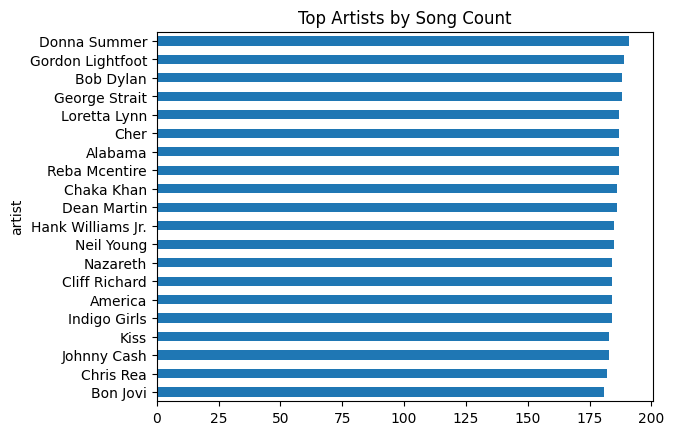

In [9]:
songs.artist.value_counts().head(20).sort_values().plot(kind='barh',title='Top Artists by Song Count')

<Axes: title={'center': 'Bottom Artists by Song Count'}, ylabel='artist'>

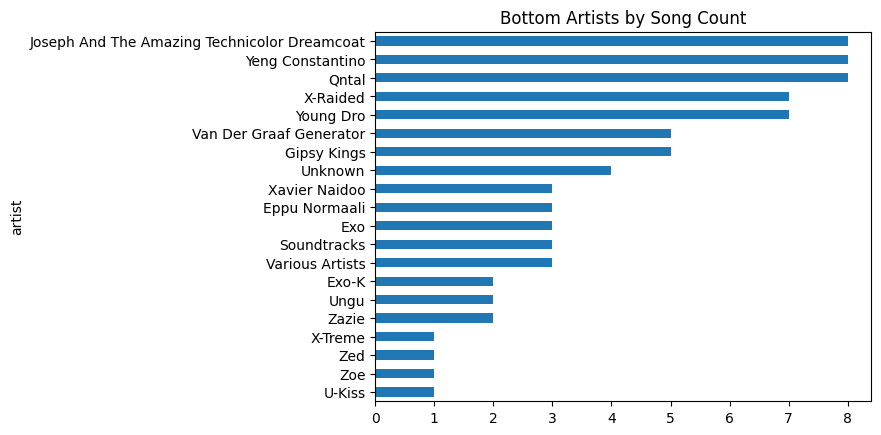

In [14]:
songs.artist.value_counts().tail(20).sort_values().plot(kind='barh',title='Bottom Artists by Song Count' )

<Axes: title={'center': 'Artist Song Count Distribution'}, ylabel='Frequency'>

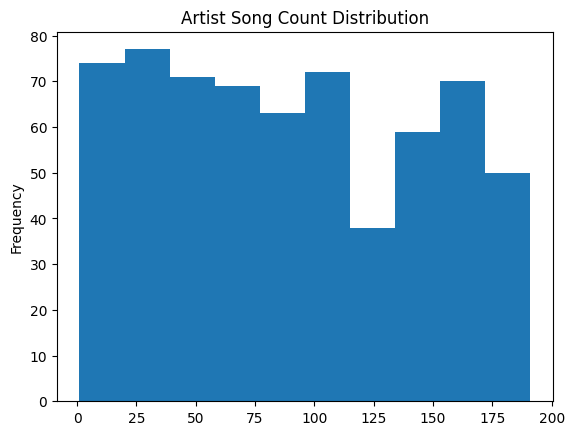

In [19]:
songs.artist.value_counts().plot(kind='hist',title='Artist Song Count Distribution')

In [20]:
songs['title_length'] = songs.song.apply(lambda x: len(x))

<Axes: title={'center': 'Top Artists by Song Title Length'}, ylabel='artist'>

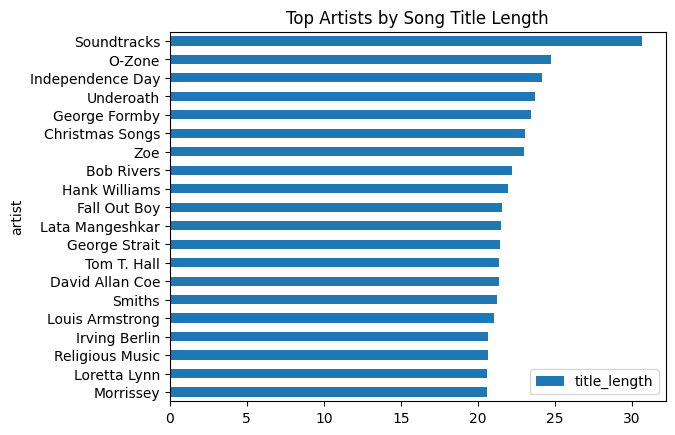

In [30]:
songs.groupby('artist', as_index=False).mean('title_length').sort_values('title_length', ascending=False).head(20).sort_values('title_length').plot(kind='barh',x='artist',y='title_length',title='Top Artists by Song Title Length')

<Axes: title={'center': 'Bottom Artists by Song Title Length'}, ylabel='artist'>

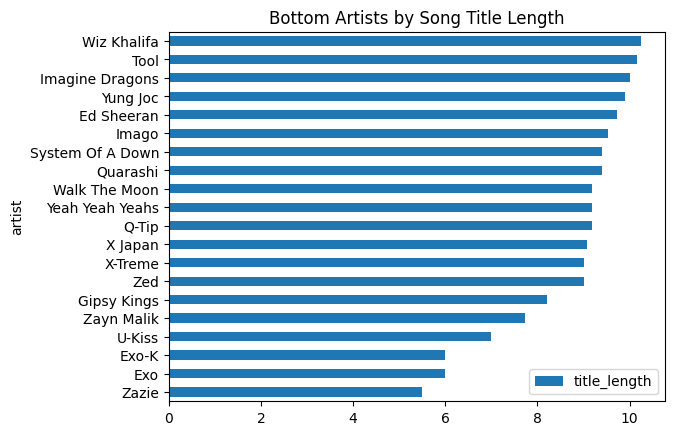

In [34]:
songs.groupby('artist', as_index=False).mean('title_length').sort_values('title_length').head(20).plot(kind='barh',x='artist',y='title_length',title='Bottom Artists by Song Title Length')

In [39]:
songs['song_length'] = songs.text.apply(lambda x: len(x.split()))

<Axes: title={'center': 'Top Artists by Song Lyrics Length'}, ylabel='artist'>

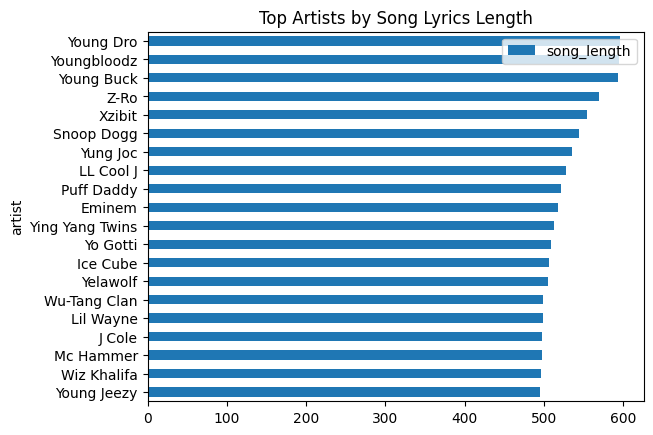

In [43]:
songs.groupby('artist', as_index=False).mean('song_length').sort_values('song_length', ascending=False).head(20).sort_values('song_length').plot(kind='barh',x='artist',y='song_length',title='Top Artists by Song Lyrics Length')

<Axes: title={'center': 'Bottom Artists by Song Lyrics Length'}, ylabel='artist'>

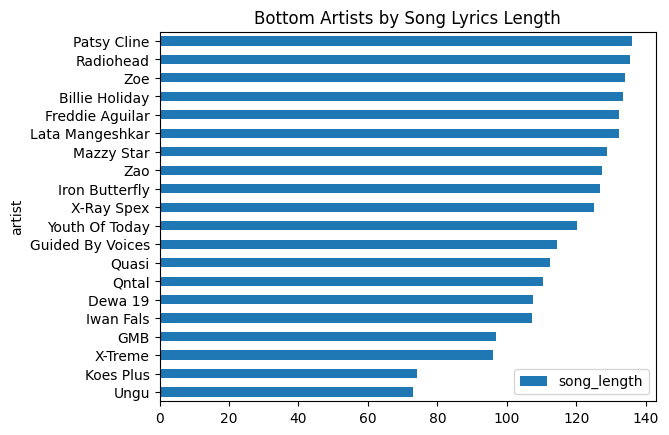

In [42]:
songs.groupby('artist', as_index=False).mean('song_length').sort_values('song_length').head(20).plot(kind='barh',x='artist',y='song_length',title='Bottom Artists by Song Lyrics Length')

### Let's pick a song at random and try to find similar songs

In [44]:
print(songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')].text.values[0])

We're no strangers to love  
You know the rules and so do I  
A full commitment's what I'm thinking of  
You wouldn't get this from any other guy  
  
I just want to tell you how I'm feeling  
Gotta make you understand  
  
[Chorus:]  
Never gonna give you up, never gonna let you down  
Never gonna run around and desert you  
Never gonna make you cry, never gonna say goodbye  
Never gonna tell a lie and hurt you  
  
We've known each other for so long  
Your heart's been aching but you're too shy to say it  
Inside we both know what's been going on  
We know the game and we're gonna play it  
  
And if you ask me how I'm feeling  
Don't tell me you're too blind to see  
  
[Chorus x2]  
Never gonna give you up, never gonna let you down  
Never gonna run around and desert you  
Never gonna make you cry, never gonna say goodbye  
Never gonna tell a lie and hurt you  
  
(Ooh give you up)  
(Ooh give you up)  
(Ooh) Never gonna give, never gonna give (give you up)  
(Ooh) Never gonna give

### Where should we start? 

Let's try matching tokens!

In [46]:
songs['tokens']=songs.text.apply(str.split)

In [48]:
songs['tokens'].head(10)

0    [Look, at, her, face,, it's, a, wonderful, fac...
1    [Take, it, easy, with, me,, please, Touch, me,...
2    [I'll, never, know, why, I, had, to, go, Why, ...
3    [Making, somebody, happy, is, a, question, of,...
4    [Making, somebody, happy, is, a, question, of,...
5    [Well,, you, hoot, and, you, holler, and, you,...
6    [Down, in, the, street, they're, all, singing,...
7    [Chiquitita,, tell, me, what's, wrong, You're,...
8    [I, was, out, with, the, morning, sun, Couldn'...
9    [I'm, waitin', for, you, baby, I'm, sitting, a...
Name: tokens, dtype: object

**Python trick #1: This is a super fast way to combine lists!**

In [50]:
all_tokens = list(itertools.chain.from_iterable(songs['tokens']))

That's like 3-4 distinct tokens per song...crazy!

In [51]:
print(f"There are {len(all_tokens):,} total tokens!")
print(f"There are {len(set(all_tokens)):,} distinct tokens!")

There are 12,653,383 total tokens!
There are 210,321 distinct tokens!


### Let's take a peak and see what all that noise is.

In [52]:
token_counts = Counter(all_tokens)
token_counts_df = pd.DataFrame.from_dict(token_counts, orient='index',columns=['count']).reset_index().rename(columns={"index":"token"}).sort_values('count', ascending=False)

Text(0.5, 1.0, 'The top words are really boring')

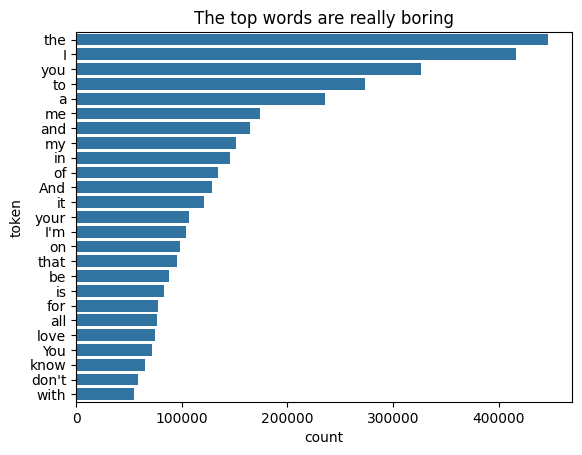

In [54]:
sns.barplot(token_counts_df.head(25), x='count', y='token').set_title('The top words are really boring')

Text(0.5, 1.0, 'The rare words are really weird')

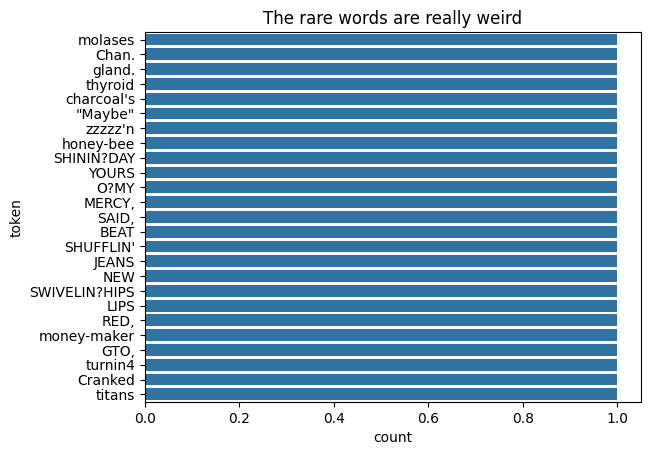

In [55]:
sns.barplot(token_counts_df.tail(25), x='count', y='token').set_title('The rare words are really weird')

Are they typos? Misspellings? Slang? All of the above?

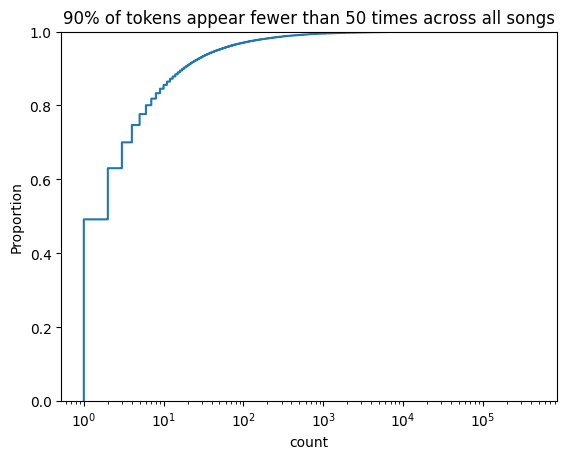

In [14]:
p = sns.ecdfplot(token_counts_df['count'], stat='proportion', log_scale=True).set_title("90% of tokens appear fewer than 50 times across all songs")

### Let's clean this mess up

1. lowercase everything
2. remove punctuation
3. stemming vs. lemmatization?
4. remove "stop words"

https://docs.cohere.com/docs/text-pre-processing-in-nlp

https://www.codecademy.com/learn/dsnlp-text-preprocessing/modules/nlp-text-preprocessing/cheatsheet

## 1. Lowercase it all!

Pros: smaller vocabulary, starting a sentence does not generate a new token

Cons: lose proper nouns and special casing

In [57]:
songs['text_lower'] = songs['text'].apply(str.lower)
songs[['text','text_lower']].head()

,text,text_lower
0,"Look at her face, it's a wonderful face \r\nA...","look at her face, it's a wonderful face \r\na..."
1,"Take it easy with me, please \r\nTouch me gen...","take it easy with me, please \r\ntouch me gen..."
2,I'll never know why I had to go \r\nWhy I had...,i'll never know why i had to go \r\nwhy i had...
3,Making somebody happy is a question of give an...,making somebody happy is a question of give an...
4,Making somebody happy is a question of give an...,making somebody happy is a question of give an...


In [58]:
lowered_tokens = list(itertools.chain.from_iterable(songs['text_lower'].apply(str.split)))
print(f"There are {len(all_tokens):,} total raw tokens!")
print(f"There are {len(set(all_tokens)):,} distinct raw tokens!\n")
print(f"There are {len(lowered_tokens):,} total lowered tokens!")
print(f"There are {len(set(lowered_tokens)):,} distinct lowered tokens!")

There are 12,653,383 total raw tokens!
There are 210,321 distinct raw tokens!

There are 12,653,383 total lowered tokens!
There are 172,868 distinct lowered tokens!


## 2. Remove (most) punctuation!

This is hard! Depending on what you want to do, you may need to make different decisions.

In [61]:
def clean_lyrics(lyrics):
    # Define the pattern to keep apostrophes in contractions and hyphens in compound words
    # Remove other common punctuation
    cleaned_lyrics = re.sub(r"[,\.!?;:()\"\\\/\[\]]", "", lyrics)
    
    # Remove extra whitespace
    cleaned_lyrics = re.sub(r"\s+", " ", cleaned_lyrics).strip()
    
    #truncate tokens at apostrophes
    cleaned_lyrics = ' '.join([token.split("'")[0] for token in cleaned_lyrics.split()])
    
    cleaned_lyrics=' '.join([token for token in cleaned_lyrics.split() if not any(char.isdigit() for char in token)])
        
    return cleaned_lyrics

In [62]:
songs['text_lower_rempunct'] = songs['text_lower'].apply(clean_lyrics)
songs[['text','text_lower_rempunct']].head(10)

,text,text_lower_rempunct
0,"Look at her face, it's a wonderful face \r\nA...",look at her face it a wonderful face and it me...
1,"Take it easy with me, please \r\nTouch me gen...",take it easy with me please touch me gently li...
2,I'll never know why I had to go \r\nWhy I had...,i never know why i had to go why i had to put ...
3,Making somebody happy is a question of give an...,making somebody happy is a question of give an...
4,Making somebody happy is a question of give an...,making somebody happy is a question of give an...
5,"Well, you hoot and you holler and you make me ...",well you hoot and you holler and you make me m...
6,Down in the street they're all singing and sho...,down in the street they all singing and shouti...
7,"Chiquitita, tell me what's wrong \r\nYou're e...",chiquitita tell me what wrong you enchained by...
8,I was out with the morning sun \r\nCouldn't s...,i was out with the morning sun couldn sleep so...
9,I'm waitin' for you baby \r\nI'm sitting all ...,i waitin for you baby i sitting all alone i fe...


In [64]:
lowered_punct_tokens = list(itertools.chain.from_iterable(songs['text_lower_rempunct'].apply(str.split)))
print(f"There are {len(all_tokens):,} total raw tokens!")
print(f"There are {len(set(all_tokens)):,} distinct raw tokens!\n")
print(f"There are {len(lowered_tokens):,} total lowered tokens!")
print(f"There are {len(set(lowered_tokens)):,} distinct lowered tokens!\n")
print(f"There are {len(lowered_punct_tokens):,} total lowered punct stripped tokens!")
print(f"There are {len(set(lowered_punct_tokens)):,} distinct lowered punct stripped tokens!")

There are 12,653,383 total raw tokens!
There are 210,321 distinct raw tokens!

There are 12,653,383 total lowered tokens!
There are 172,868 distinct lowered tokens!

There are 12,590,266 total lowered punct stripped tokens!
There are 96,200 distinct lowered punct stripped tokens!


In [65]:
def plot_top_tokens_from_lyrics(lyrics, topn=20, ax=None, title=None):
    all_tokens = list(itertools.chain.from_iterable(lyrics.apply(str.split)))
    token_counts = Counter(all_tokens)
    token_counts_df = pd.DataFrame.from_dict(token_counts, orient='index',columns=['count']).reset_index().rename(columns={"index":"token"}).sort_values('count', ascending=False)    
    sns.barplot(token_counts_df.head(topn), x='count', y='token',ax=ax).set_title(title)

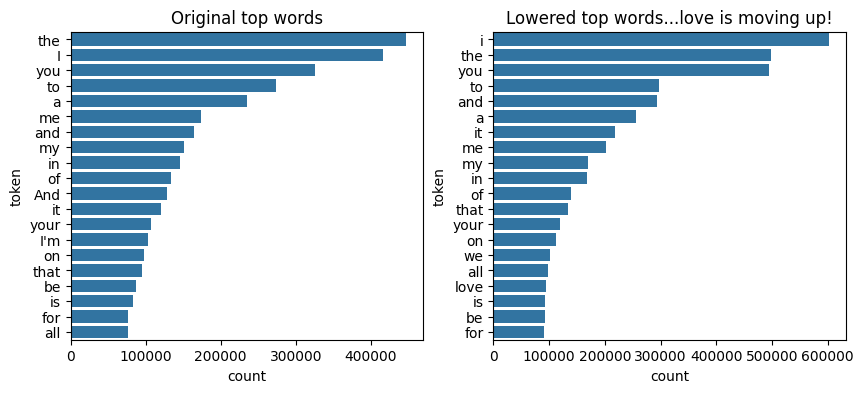

In [67]:
topn=20

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(10,4))
sns.barplot(token_counts_df.head(topn), x='count', y='token', ax=ax1).set_title('Original top words')
plot_top_tokens_from_lyrics(songs.text_lower_rempunct, topn=topn, ax=ax2, title='Lowered top words...love is moving up!')


### 3. Stemming vs. lemmatization

<div>
<img src="./figures/stemming_vs_lemmatization.png" width="800"/>
</div>

Neither one is perfect. Again, will depend on the context of the problem you are trying to solve!

In [68]:
lemmatizer = WordNetLemmatizer()

def lemmatize(lyric):
    lemmatized_lyric = ' '.join([lemmatizer.lemmatize(token) for token in lyric.split()])
    
    return lemmatized_lyric

songs['text_lower_rempunct_lemma'] = songs['text_lower_rempunct'].apply(lemmatize)
songs[['text','text_lower_rempunct_lemma']].head(10)

,text,text_lower_rempunct_lemma
0,"Look at her face, it's a wonderful face \r\nA...",look at her face it a wonderful face and it me...
1,"Take it easy with me, please \r\nTouch me gen...",take it easy with me please touch me gently li...
2,I'll never know why I had to go \r\nWhy I had...,i never know why i had to go why i had to put ...
3,Making somebody happy is a question of give an...,making somebody happy is a question of give an...
4,Making somebody happy is a question of give an...,making somebody happy is a question of give an...
5,"Well, you hoot and you holler and you make me ...",well you hoot and you holler and you make me m...
6,Down in the street they're all singing and sho...,down in the street they all singing and shouti...
7,"Chiquitita, tell me what's wrong \r\nYou're e...",chiquitita tell me what wrong you enchained by...
8,I was out with the morning sun \r\nCouldn't s...,i wa out with the morning sun couldn sleep so ...
9,I'm waitin' for you baby \r\nI'm sitting all ...,i waitin for you baby i sitting all alone i fe...


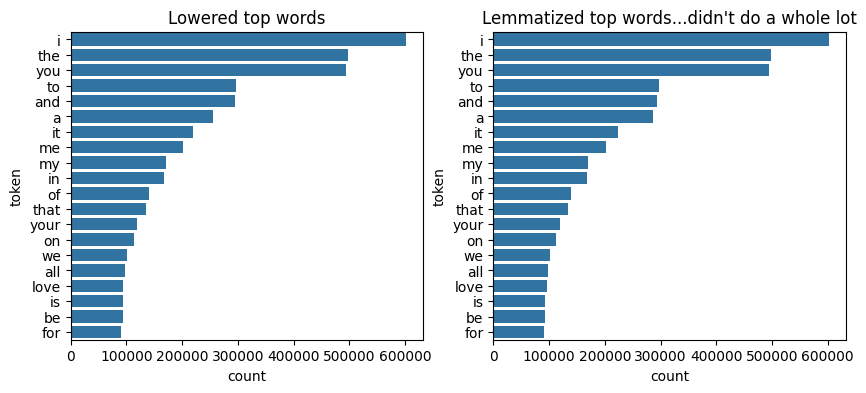

In [69]:
topn=20

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(10,4))
plot_top_tokens_from_lyrics(songs.text_lower_rempunct, topn=topn, ax=ax1, title='Lowered top words')
plot_top_tokens_from_lyrics(songs.text_lower_rempunct_lemma, topn=topn, ax=ax2, title="Lemmatized top words...didn't do a whole lot")

# If there a difference? Why?

In [75]:
lowered_punct_lemma_tokens = list(itertools.chain.from_iterable(songs['text_lower_rempunct_lemma'].apply(str.split)))
print(f"There are {len(all_tokens):,} total raw tokens!")
print(f"There are {len(set(all_tokens)):,} distinct raw tokens!\n")
print(f"There are {len(lowered_tokens):,} total lowered tokens!")
print(f"There are {len(set(lowered_tokens)):,} distinct lowered tokens!\n")
print(f"There are {len(lowered_punct_tokens):,} total lowered punct stripped tokens!")
print(f"There are {len(set(lowered_punct_tokens)):,} distinct lowered punct stripped tokens!\n")
print(f"There are {len(lowered_punct_lemma_tokens):,} total lowered punct stripped lemmatized tokens!")
print(f"There are {len(set(lowered_punct_lemma_tokens)):,} distinct lowered punct stripped lemmatized tokens!\n")

There are 12,653,383 total raw tokens!
There are 210,321 distinct raw tokens!

There are 12,653,383 total lowered tokens!
There are 172,868 distinct lowered tokens!

There are 12,590,266 total lowered punct stripped tokens!
There are 96,200 distinct lowered punct stripped tokens!

There are 12,590,266 total lowered punct stripped lemmatized tokens!
There are 88,490 distinct lowered punct stripped lemmatized tokens!



### 4. Remove Stop Words

Stop word are common word that do not add significant meaning to the text you are working with. 

Your stop words may be different for different use cases!

**THIS IS AN ITERATIVE PROCESS!!!**

<div>
<img src="./figures/stop_words.png" width="300"/>
</div>

In [71]:
stop_words = set(stopwords.words('english')) 
sorted(list(stop_words))[0:25]

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both']

In [72]:
def remove_stopwords(lyric, stop_word_list=stop_words):
    new_lyric = ' '.join([word for word in lyric.split() if word not in stop_word_list])
    return new_lyric

In [73]:
songs['text_lower_rempunct_lemma_nostop'] = songs['text_lower_rempunct_lemma'].apply(remove_stopwords)
songs[['text','text_lower_rempunct_lemma_nostop']].head(10)

,text,text_lower_rempunct_lemma_nostop
0,"Look at her face, it's a wonderful face \r\nA...",look face wonderful face mean something specia...
1,"Take it easy with me, please \r\nTouch me gen...",take easy please touch gently like summer even...
2,I'll never know why I had to go \r\nWhy I had...,never know go put lousy rotten show boy wa tou...
3,Making somebody happy is a question of give an...,making somebody happy question give take learn...
4,Making somebody happy is a question of give an...,making somebody happy question give take learn...
5,"Well, you hoot and you holler and you make me ...",well hoot holler make mad always heel holy chr...
6,Down in the street they're all singing and sho...,street singing shouting staying alive though c...
7,"Chiquitita, tell me what's wrong \r\nYou're e...",chiquitita tell wrong enchained sorrow eye hop...
8,I was out with the morning sun \r\nCouldn't s...,wa morning sun sleep thought take walk wa thin...
9,I'm waitin' for you baby \r\nI'm sitting all ...,waitin baby sitting alone feel cold without ch...


In [74]:
songs['clean_tokens']=songs.text_lower_rempunct_lemma_nostop.apply(str.split)
clean_tokens = list(itertools.chain.from_iterable(songs['clean_tokens']))

In [76]:
print(f"There are {len(all_tokens):,} total raw tokens!")
print(f"There are {len(set(all_tokens)):,} distinct raw tokens!\n")
print(f"There are {len(lowered_tokens):,} total lowered tokens!")
print(f"There are {len(set(lowered_tokens)):,} distinct lowered tokens!\n")
print(f"There are {len(lowered_punct_tokens):,} total lowered punct stripped tokens!")
print(f"There are {len(set(lowered_punct_tokens)):,} distinct lowered punct stripped tokens!\n")
print(f"There are {len(lowered_punct_lemma_tokens):,} total lowered punct stripped lemmatized tokens!")
print(f"There are {len(set(lowered_punct_lemma_tokens)):,} distinct lowered punct stripped lemmatized tokens!\n")
print(f"There are {len(clean_tokens):,} total clean tokens!")
print(f"There are {len(set(clean_tokens)):,} distinct clean tokens!")

There are 12,653,383 total raw tokens!
There are 210,321 distinct raw tokens!

There are 12,653,383 total lowered tokens!
There are 172,868 distinct lowered tokens!

There are 12,590,266 total lowered punct stripped tokens!
There are 96,200 distinct lowered punct stripped tokens!

There are 12,590,266 total lowered punct stripped lemmatized tokens!
There are 88,490 distinct lowered punct stripped lemmatized tokens!

There are 6,163,675 total clean tokens!
There are 88,341 distinct clean tokens!


### LOOK HOW MANY TOKENS WERE REMOVED!

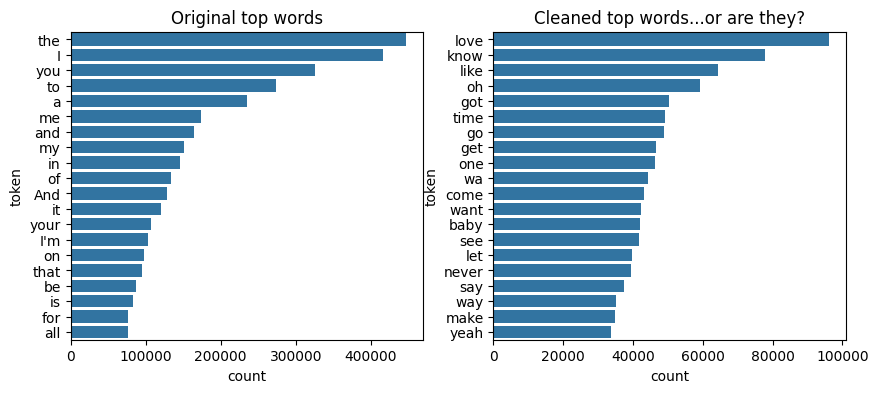

In [77]:
topn=20

fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(10,4))
sns.barplot(token_counts_df.head(topn), x='count', y='token', ax=ax1).set_title('Original top words')
plot_top_tokens_from_lyrics(songs.text_lower_rempunct_lemma_nostop, topn=topn, ax=ax2, title='Cleaned top words...or are they?')

In [79]:
print(f"{songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')].text.values[0][0:225]}...")
print('\nVS.\n')
print(f"{songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')].text_lower_rempunct_lemma_nostop.values[0][0:96]} ...")

We're no strangers to love  
You know the rules and so do I  
A full commitment's what I'm thinking of  
You wouldn't get this from any other guy  
  
I just want to tell you how I'm feeling  
Gotta make you understand ...

VS.

stranger love know rule full commitment thinking get guy want tell feeling gotta make understand ...


### Let's look at how many words we match.

In [80]:
never_gonna_give_you_tokens_raw = songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')].tokens.values[0]
never_gonna_give_you_tokens_clean = songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')].clean_tokens.values[0]

In [81]:
songs['astley_match_raw'] = songs.tokens.apply(lambda x: set(x) & set(never_gonna_give_you_tokens_raw))
songs['astley_match_clean'] = songs.tokens.apply(lambda x: set(x) & set(never_gonna_give_you_tokens_clean))

In [82]:
songs[['artist', 'song', 'text','astley_match_raw', 'astley_match_clean']].head(10)

,artist,song,text,astley_match_raw,astley_match_clean
0,ABBA,Ahe's My Kind Of Girl,"Look at her face, it's a wonderful face \r\nA...","{what, I'm, I, and, to, of, on, it, if, me, th...",{}
1,ABBA,"Andante, Andante","Take it easy with me, please \r\nTouch me gen...","{feeling, play, me, a, know, and, down, you're...","{feeling, play, make, let, know}"
2,ABBA,As Good As New,I'll never know why I had to go \r\nWhy I had...,"{too, to, me, a, know, and, love, Never, never...","{love, make, never, get, know}"
3,ABBA,Bang,Making somebody happy is a question of give an...,"{feeling, to, if, a, know, and, love, Never, Y...","{love, feeling, around, give, get, know}"
4,ABBA,Bang-A-Boomerang,Making somebody happy is a question of give an...,"{feeling, to, if, a, know, and, love, Never, Y...","{love, feeling, around, give, get, know}"
5,ABBA,Burning My Bridges,"Well, you hoot and you holler and you make me ...","{what, I'm, I, been, and, You, of, for, no, it...","{make, gonna}"
6,ABBA,Cassandra,Down in the street they're all singing and sho...,"{to, a, know, and, aching, but, You, for, on, ...","{know, aching}"
7,ABBA,Chiquitita,"Chiquitita, tell me what's wrong \r\nYou're e...","{too, to, me, this, a, know, and, Your, what's...","{see, cry, know, tell}"
8,ABBA,Crazy World,I was out with the morning sun \r\nCouldn't s...,"{feeling, to, me, this, a, know, what, other, ...","{gonna, feeling, see, blind, thinking, guy, te..."
9,ABBA,Crying Over You,I'm waitin' for you baby \r\nI'm sitting all ...,"{I'm, I, to, of, the, me, do, so, for, never, ...","{never, know}"


In [83]:
songs['astley_match_raw_length'] = songs['astley_match_raw'].apply(len)
songs['astley_match_clean_length'] = songs['astley_match_clean'].apply(len)

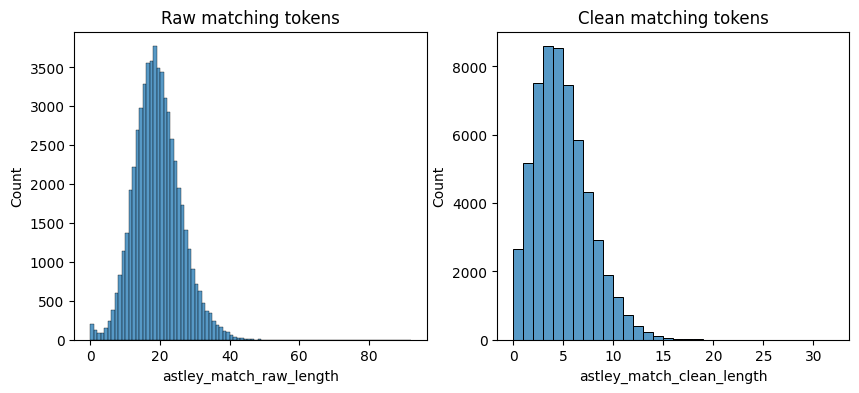

In [84]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=False, sharey=False, figsize=(10,4))
p=sns.histplot(songs.astley_match_raw_length, binwidth=1, ax=ax1).set_title('Raw matching tokens')
p=sns.histplot(songs.astley_match_clean_length, binwidth=1, ax=ax2).set_title('Clean matching tokens')


In [85]:
top10_raw = songs.sort_values('astley_match_raw_length', ascending=False)[['artist', 'song', 'text','astley_match_raw', 'astley_match_raw_length']].head(10)
top10_raw

,artist,song,text,astley_match_raw,astley_match_raw_length
50844,Rick Astley,Never Gonna Give You Up,We're no strangers to love \r\nYou know the r...,"{strangers, up), goodbye, [Chorus:], know, and...",92
16477,Puff Daddy,Satisfy You,[Puffy] \r\nAll I want is somebody who's gonn...,"{too, feeling, to, We, play, me, this, a, hurt...",48
51834,Snoop Dogg,I Believe In You,[Latoiya Williams] \r\nI'm so glad that you b...,"{too, we're, feeling, to, We, We're, play, if,...",48
43360,Mc Hammer,Crime Story,"Crime stories \r\nYou get, boy, no glory \r\...","{too, we're, to, We, play, if, me, this, a, kn...",47
8862,J Cole,Friday Night,"Yeah, \r\nHey, \r\nYeah, \r\n \r\nPartiall...","{too, to, We, play, if, me, this, a, hurt, kno...",46
31411,Eminem,Kim,Aw look at daddy's baby girl \r\nThat's daddy...,"{too, we're, to, We, if, me, this, a, want, wh...",46
5076,Eminem,Farewell,I don't wanna say goodbye \r\nBut sometimes t...,"{strangers, we're, to, We, if, me, goodbye, ea...",46
30494,Drake,Poetic Justice,"Every second, every minute, man I swear that s...","{too, to, We, play, if, me, this, a, know, wan...",45
11541,Lil Wayne,Breakin' My Heart,(feat. Little Brother) \r\n \r\nHey baby loo...,"{to, We, play, if, me, this, a, know, [Chorus,...",45
41941,LL Cool J,Jack The Ripper,"Milky, and I'm back \r\nMy ace in the hole wa...","{to, play, if, me, [Chorus:], this, a, know, a...",45


In [86]:
top10_clean=songs.sort_values('astley_match_clean_length', ascending=False)[['artist', 'song', 'text','astley_match_clean', 'astley_match_clean_length']].head(10)
top10_clean

,artist,song,text,astley_match_clean,astley_match_clean_length
50844,Rick Astley,Never Gonna Give You Up,We're no strangers to love \r\nYou know the r...,"{feeling, play, full, goodbye, hurt, know, wan...",32
11721,Lionel Richie,Do It To Me,"Girl, you're such a bad thing \r\nStanding th...","{heart, cry, feeling, goodbye, hurt, know, wan...",20
15288,Outkast,The Train,All aboard \r\nOr are all y'all bored? \r\nI...,"{heart, feeling, goodbye, hurt, know, want, ga...",19
16477,Puff Daddy,Satisfy You,[Puffy] \r\nAll I want is somebody who's gonn...,"{want, heart, gonna, make, feeling, love, let,...",18
16731,R. Kelly,If I'm Wit You,I don't understand \r\nI do all this for you ...,"{want, heart, ooh, love, see, ask, get, game, ...",18
41941,LL Cool J,Jack The Ripper,"Milky, and I'm back \r\nMy ace in the hole wa...","{want, gonna, love, see, ask, get, game, aroun...",18
49206,Puff Daddy,I Hear Voices,Sometimes I don't think you motherfuckers \r\...,"{heart, rule, gonna, love, see, get, understan...",18
57104,Yelawolf,Throw It Up,Aye boo get these motherfuckers and pass that ...,"{want, heart, gonna, feeling, see, ask, get, g...",17
57251,YG,Do It To Ya,"Annie, girl, let's play house \r\nAnd you can...","{want, going, gonna, make, let, ask, thinking,...",17
57268,Ying Yang Twins,Long Time,"Girl, Me and the Lods been friends for a might...","{want, heart, going, gonna, make, feeling, lov...",17


In [87]:
print("Raw token match vs. Clean token match")
pd.concat([top10_raw[['artist', 'song']].reset_index(drop=True), top10_clean[['artist', 'song']].reset_index(drop=True)], axis=1)

Raw token match vs. Clean token match


,artist,song,artist,song
0,Rick Astley,Never Gonna Give You Up,Rick Astley,Never Gonna Give You Up
1,Puff Daddy,Satisfy You,Lionel Richie,Do It To Me
2,Snoop Dogg,I Believe In You,Outkast,The Train
3,Mc Hammer,Crime Story,Puff Daddy,Satisfy You
4,J Cole,Friday Night,R. Kelly,If I'm Wit You
5,Eminem,Kim,LL Cool J,Jack The Ripper
6,Eminem,Farewell,Puff Daddy,I Hear Voices
7,Drake,Poetic Justice,Yelawolf,Throw It Up
8,Lil Wayne,Breakin' My Heart,YG,Do It To Ya
9,LL Cool J,Jack The Ripper,Ying Yang Twins,Long Time


## Can we do better?

1. There were still a lot of noise words in there.
2. There could be misspellings (mispellings? ms. pellings?).
3. Lots of word are spelled differently but have similar meaning
4. Context matters!



<div>
<img src="./figures/classic_v_deep.png" width="800"/>
</div>

### ENTER WORD VECTORS TO SAVE THE DAY!

<div>
<img src="./figures/super_word_vector.png" width="400"/>
</div>

### One-hot encoding

1. The CURSE OF DIMENSIONALITY!!!!
2. So sparse!
3. Synonyms, antonyms
4. But where is the context?
5. Still doesn't fix the frequent word problem

<div>
<img src="./figures/word_bird.png" width="600"/>
</div>

### word2vec

<div>
<img src="./figures/word2vec.png" width="800"/>
</div>

<div>
<img src="./figures/w2v.jpg" width="800"/>
</div>

<div>
<img src="./figures/vector_relationships.png" width="800"/>
</div>

<div>
<img src="./figures/word_distribution.png" width="800"/>
</div>

<div>
<img src="./figures/newsgroup.png" width="500"/>
</div>

In [89]:
def has_number(token):
        return any(char.isdigit() for char in token)

In [88]:
def remove_tokens_with_numbers(lines):
    # Function to check if the token contains any digit
    def has_number(token):
        return any(char.isdigit() for char in token)
    
    # Apply the function to filter out tokens with numbers from each line
    cleaned_lines = [' '.join([token for token in line.split() if not has_number(token)]) for line in lines]
    
    return cleaned_lines


In [90]:
def clean_for_w2v(text):
    text = text.lower().splitlines()
    text = [re.sub(r"[,\.!?;:()\"\\\/\[\]]", "", line) for line in text]
    text = [' '.join([token.split("'")[0] for token in line.split()]) for line in text]
    text = [' '.join([token for token in line.split() if not any(char.isdigit() for char in token)]) for line in text]
    text = [lemmatize(line) for line in text]
    text = [remove_stopwords(line) for line in text]
    text = [re.sub(r"\s+", " ", line).strip() for line in text]
    text = [line for line in text if len(line)>0]
    return text

In [91]:
#This one take about 50 seconds. Be patient Ben!
songs['text_for_w2v'] = songs['text'].apply(clean_for_w2v)

In [92]:
songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')]['text_for_w2v'].values[0]

['stranger love',
 'know rule',
 'full commitment thinking',
 'get guy',
 'want tell feeling',
 'gotta make understand',
 'chorus',
 'never gonna give never gonna let',
 'never gonna run around desert',
 'never gonna make cry never gonna say goodbye',
 'never gonna tell lie hurt',
 'known long',
 'heart aching shy say',
 'inside know going',
 'know game gonna play',
 'ask feeling',
 'tell blind see',
 'chorus',
 'never gonna give never gonna let',
 'never gonna run around desert',
 'never gonna make cry never gonna say goodbye',
 'never gonna tell lie hurt',
 'ooh give',
 'ooh give',
 'ooh never gonna give never gonna give give',
 'ooh never gonna give never gonna give give',
 'known long',
 'heart aching shy say',
 'inside know going',
 'know game gonna play',
 'want tell feeling',
 'gotta make understand',
 'chorus',
 'never gonna give never gonna let',
 'never gonna run around desert',
 'never gonna make cry never gonna say goodbye',
 'never gonna tell lie hurt']

In [93]:
all_song_lines = list(itertools.chain.from_iterable(songs['text_for_w2v'].values))

In [94]:
len(all_song_lines)

1986905

In [95]:
print('median: ',np.median([len(line) for line in all_song_lines]))
print('mean: ',np.mean([len(line) for line in all_song_lines]))
print('longest song line: ',np.max([len(line) for line in all_song_lines]))

median:  16.0
mean:  17.137456999705574
longest song line:  105


In [96]:
class LossLogger(w2v.callbacks.CallbackAny2Vec):
    '''Output loss at each epoch'''
    def __init__(self):
        self.epoch = 1
        self.losses = []

    def on_epoch_begin(self, model):
        print(f'Epoch: {self.epoch}', end='\t')

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        self.losses.append(loss)
        print(f'  Loss: {loss}')
        self.epoch += 1

In [97]:
# Ben! This takes about 20 seconds. Isn't that amazing?
loss_logger = LossLogger()
w2v_model =  w2v.Word2Vec([text.split() for text in all_song_lines], vector_size=300, window=7, min_count=5, workers=7, sg=0, epochs=3, compute_loss=True,callbacks=[loss_logger])

Epoch: 1	  Loss: 1898801.75
Epoch: 2	  Loss: 3471329.25
Epoch: 3	  Loss: 4924959.5


In [215]:
# w2v_model.save('./model.w2v')

In [4]:
#w2v_model = w2v.Word2Vec.load('./model.w2v')

In [98]:
print(f"My model has a vocabulary of {len(w2v_model.wv.key_to_index):,} words")

My model has a vocabulary of 25,722 words


In [99]:
w2v_model.wv['love']

array([-4.60002832e-02,  1.03242680e-01,  1.08147979e-01,  6.44246876e-01,
       -9.38857853e-01, -6.79012358e-01, -5.73994219e-01,  5.31421900e-01,
       -4.76389736e-01,  2.21203655e-01, -1.23037182e-01, -6.32442981e-02,
       -4.60456848e-01,  7.17532337e-01, -4.22956854e-01, -1.53809441e-02,
        4.17697370e-01, -1.83920383e-01, -2.63193339e-01, -3.71051490e-01,
        3.34262222e-01,  5.04965663e-01,  1.38964310e-01,  2.78479606e-01,
        2.18894497e-01,  2.41965637e-01, -7.20177829e-01,  3.04876000e-01,
       -2.32012406e-01, -4.39441055e-01, -4.99895722e-01,  3.80224109e-01,
       -1.96980059e-01,  1.94422364e-01, -2.78239846e-01,  3.17297727e-01,
        3.68905544e-01, -6.69619322e-01,  4.16087091e-01,  1.19469248e-01,
       -1.98989421e-01,  3.19863588e-01,  3.77533048e-01, -2.19360113e-01,
        2.69449592e-01, -8.83828700e-02,  2.30834857e-01,  1.71220869e-01,
        3.75227965e-02,  1.00934349e-01, -4.32339579e-01,  6.15748227e-01,
        5.28524280e-01, -

In [100]:
w2v_model.wv.most_similar('love')

[('loving', 0.6020525097846985),
 ('loved', 0.4914267659187317),
 ('lovin', 0.47531768679618835),
 ('affair', 0.4675482213497162),
 ('affection', 0.4672643542289734),
 ('darlin', 0.4526539444923401),
 ('guarantee', 0.4520503878593445),
 ('know', 0.44601669907569885),
 ('surrender', 0.44483962655067444),
 ('believe', 0.4380129277706146)]

In [101]:
w2v_model.wv.most_similar('baby')

[('babe', 0.6488351821899414),
 ('darlin', 0.6307052969932556),
 ('darling', 0.5293887257575989),
 ('mamma', 0.5274317264556885),
 ('girl', 0.526885986328125),
 ('honey', 0.5232821106910706),
 ('beggin', 0.518202006816864),
 ('ooo', 0.5092958807945251),
 ('lovin', 0.5058111548423767),
 ('momma', 0.5027827024459839)]

In [102]:
w2v_model.wv.most_similar('cat')

[('dog', 0.7089610695838928),
 ('rat', 0.6322811245918274),
 ('bull', 0.6080790162086487),
 ('flea', 0.6072978973388672),
 ('kitty', 0.6037119030952454),
 ('snake', 0.601693868637085),
 ('mack', 0.5971798896789551),
 ('slick', 0.5946071147918701),
 ('pig', 0.5918241739273071),
 ('alley', 0.5890815258026123)]

In [103]:
w2v_model.wv.most_similar(positive=['woo'])

[('hoo', 0.8349087238311768),
 ('whoo', 0.7829393148422241),
 ('oo', 0.7665623426437378),
 ('whew', 0.7540620565414429),
 ('ahhh', 0.744096577167511),
 ('rarara', 0.7377074956893921),
 ('speedballin', 0.7319420576095581),
 ('doot', 0.7318408489227295),
 ('hmm', 0.7317485213279724),
 ('aw', 0.7272121906280518)]

In [104]:
w2v_model.wv.most_similar('crunk')

[('jiggy', 0.8447638750076294),
 ('gunn', 0.8291527628898621),
 ('trashed', 0.8209035992622375),
 ('ish', 0.8147048354148865),
 ('jacked', 0.8110083937644958),
 ('tunechi', 0.8107234239578247),
 ('patna', 0.8102957606315613),
 ('kellz', 0.8063233494758606),
 ('freaky', 0.8051009178161621),
 ('allot', 0.7992180585861206)]

In [105]:
w2v_model.wv.most_similar(positive=['king','woman'], negative=['man'])

[('queen', 0.541273295879364),
 ('tutankhamun', 0.4569847881793976),
 ('newborn', 0.4499342739582062),
 ('ruler', 0.4344377815723419),
 ('praise', 0.41934236884117126),
 ('alleluia', 0.4177093207836151),
 ('hail', 0.4161498546600342),
 ('throne', 0.4123435914516449),
 ('princess', 0.40863680839538574),
 ('israel', 0.40680620074272156)]

In [106]:
w2v_model.wv.most_similar(positive=['car','country'], negative=['city'])

[('truck', 0.4782583713531494),
 ('cadillac', 0.4767330288887024),
 ('farm', 0.4490118622779846),
 ('pickup', 0.4256908893585205),
 ('suitcase', 0.42438921332359314),
 ('memphis', 0.4165340065956116),
 ('ticket', 0.4077599346637726),
 ('benz', 0.4049523174762726),
 ('bank', 0.40112704038619995),
 ('tennessee', 0.40090060234069824)]

In [107]:
w2v_model.wv.most_similar(positive=['love','country'], negative=['city'])

[('loving', 0.5266682505607605),
 ('loved', 0.4665357172489166),
 ('lovin', 0.4363706409931183),
 ('affection', 0.42388594150543213),
 ('sweetheart', 0.4149353802204132),
 ('inspiration', 0.4139321744441986),
 ('happiness', 0.39611199498176575),
 ('sweet', 0.38143572211265564),
 ('remind', 0.38065311312675476),
 ('truly', 0.374005526304245)]

In [108]:
w2v_model.wv.most_similar(positive=['love','city'], negative=['country'])

[('mistake', 0.3875005543231964),
 ('beginning', 0.37081706523895264),
 ('baby', 0.3645586669445038),
 ('realize', 0.3632907569408417),
 ('dream', 0.35677310824394226),
 ('darkness', 0.35646381974220276),
 ('afraid', 0.3494715988636017),
 ('difference', 0.34600186347961426),
 ('light', 0.3254444897174835),
 ('everlasting', 0.3248668909072876)]

### Let's explore how we can visualize this model.

How do we view 300 dimensions?

UMAP! (or PCA or ICA or T-SNE)

In [109]:
words = list(w2v_model.wv.index_to_key[:1000])  # List of words in the model's vocabulary; limiting to top 1000
word_vectors = np.array([w2v_model.wv[word] for word in words])

umap_reducer = UMAP(n_neighbors=15, min_dist=0.0, n_components=2, random_state=42)
word_vectors_reduced = umap_reducer.fit_transform(word_vectors)

# Step 3: Plot using Plotly
fig = px.scatter(x=word_vectors_reduced[:, 0], y=word_vectors_reduced[:, 1], text=words)
fig.update_traces(textposition='top center')
fig.update_layout(height=800, width=800, title_text='Top 1000 Words Vocabulary Visualization with UMAP and Plotly')
fig.show()

### We can do the same thing for whole songs!

In [112]:
#takes about 40 seconds
songs['w2v_embedding'] = songs.clean_tokens.apply(lambda x: w2v_model.wv.get_mean_vector(x))

In [117]:
#Just wait a minute...it'll finish
umap_reducer = UMAP(n_neighbors=15, min_dist=0.0, n_components=2, random_state=42)
word_vectors_reduced = umap_reducer.fit_transform(np.array(songs['w2v_embedding'].values.tolist()))

# Step 3: Plot using Plotly
fig = px.scatter(x=word_vectors_reduced[:, 0], y=word_vectors_reduced[:, 1], hover_data={'artist':songs['artist'], 'title':songs['song']} )
fig.update_traces(textposition='top center')
fig.update_layout(height=800, width=800, title_text='ALL THE SONGS!')
fig.show()

### Now back to the matter at hand

In [118]:
astley_vector_w2v = songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')]['w2v_embedding'].values[0]
print(astley_vector_w2v)

[ 0.02001231  0.01227283 -0.01229856  0.02454158 -0.01286903 -0.04037882
  0.0103927   0.06644809 -0.00736747 -0.00042688 -0.05338909 -0.0501362
 -0.03243713  0.03297535 -0.01356682  0.01242428  0.03388501 -0.01080486
 -0.00840526 -0.04158083  0.02056185 -0.00449857  0.01850748  0.04963981
  0.05684731  0.00126849 -0.04243665  0.0324841   0.03342933 -0.00888425
  0.0379708   0.00019974 -0.04109181  0.01958425 -0.02762403  0.03728171
  0.00794911 -0.03446159 -0.0210287  -0.00180281 -0.01790245  0.00714586
  0.059264   -0.02152664  0.0019255   0.03138126 -0.00467455 -0.0311161
 -0.00211111  0.00380366  0.02190663  0.05082656  0.01778826 -0.01066554
 -0.00905272  0.04621799 -0.02519408 -0.02347021  0.0088123  -0.0500205
 -0.01936414  0.00332669  0.02879042  0.02249889 -0.00586297 -0.0127443
  0.02764973  0.00298121  0.00489537 -0.04589363 -0.04290086  0.01794045
  0.00482781 -0.02644208 -0.02880632  0.0251273  -0.02286477  0.01538992
 -0.01468664  0.02493764 -0.0518977   0.00472009 -0.030

In [119]:
all_vectors_w2v = np.stack(songs['w2v_embedding'].values)

In [120]:
def normalize_vector(v):
    """Normalize a vector to unit length."""
    norm = np.linalg.norm(v)
    return v if norm == 0 else v / norm

def cosine_distance(v1, v2):
    """Calculate the cosine distance between two vectors."""
    # Ensure both vectors are normalized
    v1_normalized = normalize_vector(v1)
    v2_normalized = normalize_vector(v2)
    
    # Calculate cosine similarity and convert to cosine distance
    cosine_similarity = np.dot(v1_normalized, v2_normalized)
    cosine_distance = 1 - cosine_similarity
    return cosine_distance

In [131]:
distances = [cosine_distance(astley_vector_w2v, vec) for vec in all_vectors_w2v]
songs['w2v_embedding_distances'] = distances 
top10_w2v = songs.sort_values('w2v_embedding_distances')[['artist', 'song','w2v_embedding_distances']].head(10)
top10_w2v

,artist,song,w2v_embedding_distances
50844,Rick Astley,Never Gonna Give You Up,0.00
41238,Lana Del Rey,You're Gonna Love Me,0.06
31939,Europe,Never Gonna Say Good Bye,0.07
33165,Freestyle,This Time,0.07
7645,Heart,Never,0.07
26726,Cake,"Never, Never Gonna Give You Up",0.07
30415,Doris Day,Love Me In The Daytime,0.07
20266,Used,Cry,0.07
20919,Violent Femmes,Never Tell,0.08
6935,Glen Campbell,I'm Not Gonna Miss You,0.08


## State of the Art

In [ ]:
ai_endpoint = os.getenv('AI_RESOURCE_ENDPOINT')
ai_api_version = os.getenv('AI_API_VERSION')
ai_api_key = os.getenv("AI_API_KEY")
ai_deployment = "MECtext-embedding-3-small"

In [38]:
client = AzureOpenAI(
  api_key = ai_api_key,  
  api_version = ai_api_version,
  azure_endpoint = ai_endpoint
)

In [39]:
def get_open_ai_embedding(lyrics):
    response = client.embeddings.create(input=lyrics,model=ai_deployment)
    return response

In [45]:
# 3 hours and $0.35 later....
batch_size = 500  # Set your batch size
embeddings = []

for i in range(24_000, len(songs.text), batch_size):
    print(f"Running batch {i}: ", datetime.now())
    batch = list(songs.text)[i:i + batch_size]
    result = get_open_ai_embedding(batch)
    embeddings.append(result.data)
    time.sleep(60)

vectors = list(itertools.chain.from_iterable(embeddings))
print(len(vectors))

with open('openai_vecs.pkl', 'wb') as f:
    pickle.dump(vectors,f)

Running batch 24000:  2024-03-26 09:44:23.811582
Running batch 24500:  2024-03-26 09:45:04.799733
Running batch 25000:  2024-03-26 09:46:05.832414
Running batch 25500:  2024-03-26 09:47:06.120490
Running batch 26000:  2024-03-26 09:48:08.407994
Running batch 26500:  2024-03-26 09:49:09.701013
Running batch 27000:  2024-03-26 09:50:10.646628
Running batch 27500:  2024-03-26 09:51:12.107330
Running batch 28000:  2024-03-26 09:52:12.863268
Running batch 28500:  2024-03-26 09:53:13.530739
Running batch 29000:  2024-03-26 09:54:14.440156
Running batch 29500:  2024-03-26 09:55:15.408736
Running batch 30000:  2024-03-26 09:56:16.383552
Running batch 30500:  2024-03-26 09:57:17.719159
Running batch 31000:  2024-03-26 09:58:19.354761
Running batch 31500:  2024-03-26 09:59:20.532024
Running batch 32000:  2024-03-26 10:00:21.477156
Running batch 32500:  2024-03-26 10:01:23.132878
Running batch 33000:  2024-03-26 10:02:23.254672
Running batch 33500:  2024-03-26 10:03:24.848847
Running batch 34000:

In [122]:
with open('openai_vecs.pkl', 'rb') as f:
    vectors = pickle.load(f)

In [123]:
songs['openai_embeddings'] = vectors
songs['openai_embeddings'] =songs['openai_embeddings'].apply(lambda x:np.array(x.embedding))

In [58]:
#songs.to_pickle('songs.pkl')

In [124]:
astley_vector = songs[(songs.artist=='Rick Astley') & (songs.song=='Never Gonna Give You Up')]['openai_embeddings'].values[0]
print(astley_vector)

[ 0.00545065 -0.00360638 -0.01963821 ...  0.01459551  0.01798376
  0.00827797]


In [125]:
print(len(astley_vector))

1536


In [126]:
all_vectors = np.stack(songs['openai_embeddings'].values)

In [127]:
def normalize_vector(v):
    """Normalize a vector to unit length."""
    norm = np.linalg.norm(v)
    return v if norm == 0 else v / norm

def cosine_distance(v1, v2):
    """Calculate the cosine distance between two vectors."""
    # Ensure both vectors are normalized
    v1_normalized = normalize_vector(v1)
    v2_normalized = normalize_vector(v2)
    
    # Calculate cosine similarity and convert to cosine distance
    cosine_similarity = np.dot(v1_normalized, v2_normalized)
    cosine_distance = 1 - cosine_similarity
    return cosine_distance

In [129]:
# Calculate cosine distance between the reference vector and each of the other vectors
distances = [cosine_distance(astley_vector, vec) for vec in all_vectors]
songs['openai_embedding_distances'] = distances 
top10_openai = songs.sort_values('openai_embedding_distances')[['artist', 'song','openai_embedding_distances']].head(10)
top10_openai


,artist,song,openai_embedding_distances
50844,Rick Astley,Never Gonna Give You Up,-0.00
17829,Rod Stewart,Heart Is On The Line,0.23
50852,Rick Astley,Take Me To Your Heart,0.23
42552,Madonna,Never Let You Go,0.24
33140,Freestyle,Coro - Can't Let You Go,0.24
41818,Lionel Richie,I Call It Love,0.24
24461,Backstreet Boys,End Of The Road,0.24
39666,Kelly Clarkson,Don't Let Me Stop You,0.24
19403,Tom Jones,Never,0.25
24488,Backstreet Boys,I'll Be There For You,0.25


In [133]:
print('raw vs clean vs w2v vs openai')
pd.concat([top10_raw[['artist', 'song']].reset_index(drop=True), 
            top10_clean[['artist', 'song']].reset_index(drop=True), 
            top10_w2v[['artist', 'song']].reset_index(drop=True),
            top10_openai[['artist', 'song']].reset_index(drop=True)], axis=1)

raw vs clean vs w2v vs openai


,artist,song,artist,song,artist,song,artist,song
0,Rick Astley,Never Gonna Give You Up,Rick Astley,Never Gonna Give You Up,Rick Astley,Never Gonna Give You Up,Rick Astley,Never Gonna Give You Up
1,Puff Daddy,Satisfy You,Lionel Richie,Do It To Me,Lana Del Rey,You're Gonna Love Me,Rod Stewart,Heart Is On The Line
2,Snoop Dogg,I Believe In You,Outkast,The Train,Europe,Never Gonna Say Good Bye,Rick Astley,Take Me To Your Heart
3,Mc Hammer,Crime Story,Puff Daddy,Satisfy You,Freestyle,This Time,Madonna,Never Let You Go
4,J Cole,Friday Night,R. Kelly,If I'm Wit You,Heart,Never,Freestyle,Coro - Can't Let You Go
5,Eminem,Kim,LL Cool J,Jack The Ripper,Cake,"Never, Never Gonna Give You Up",Lionel Richie,I Call It Love
6,Eminem,Farewell,Puff Daddy,I Hear Voices,Doris Day,Love Me In The Daytime,Backstreet Boys,End Of The Road
7,Drake,Poetic Justice,Yelawolf,Throw It Up,Used,Cry,Kelly Clarkson,Don't Let Me Stop You
8,Lil Wayne,Breakin' My Heart,YG,Do It To Ya,Violent Femmes,Never Tell,Tom Jones,Never
9,LL Cool J,Jack The Ripper,Ying Yang Twins,Long Time,Glen Campbell,I'm Not Gonna Miss You,Backstreet Boys,I'll Be There For You


In [65]:
print(songs[(songs.artist=='Rod Stewart') & (songs.song=='Heart Is On The Line')].text.values[0])

What do you want from me  
When will you ever see  
I gave it all nothing less  
The feeling ain't mutual I guess  
Why am I so confused  
Why do I feel so used  
This game at hand was made for two  
But somehow I played without you  
  
No I'm not sad  
Nothin' lasts forever  
Head over heels  
Better late than never  
  
[Chorus]  
My heart is on the line  
Running out of time  
Love stop making a fool out of me  
My heart is on the line  
Running out of time  
Love stop making a fool out of me  
  
Telling my friends you're fine  
Even our favorite wine  
But you're not there and it hurts  
Nobody knows how it hurts  
Maybe I thought I knew  
That I belonged to you  
I dreamed a dream I couldn't have  
I foolishly let myself dance  
Inside your eyes  
Oh don't be sad  
I should've known better  
Why didn't I realize  
  
[Chorus]  
  
Love stop making a fool out of me  
Love stop making a fool out of me  
  
Whenever you call me up  
Everything else must stop  
My heart says stay bu

### Let's make a lazy recommendation engine!

In [66]:
def find_closest_songs(artist, song, topn=10, most_similar=True):
    song_vector = songs[(songs.artist==artist) & (songs.song==song)]['openai_embeddings'].values[0]
    distances = [cosine_distance(song_vector, vec) for vec in all_vectors]
    songs[f'openai_embedding_distances_{artist}_{song}'] = distances
    top_songs = songs.sort_values(f'openai_embedding_distances_{artist}_{song}', ascending=most_similar)[['artist', 'song',f'openai_embedding_distances_{artist}_{song}']].head(topn)
    return top_songs

In [67]:
find_closest_songs('Queen', 'Bohemian Rhapsody')

,artist,song,openai_embedding_distances_Queen_Bohemian Rhapsody
49284,Queen,Bohemian Rhapsody,-0.00
55888,Weird Al Yankovic,Bohemian Polka,0.01
29267,Deep Purple,Slow Train,0.25
55965,Westlife,Bop Bop Baby,0.26
35788,Helloween,When The Sinner,0.26
474,Alice Cooper,Ballad Of Dwight Fry,0.27
21342,Wham!,The Edge Of Heaven,0.27
8607,INXS,Hungry,0.27
33760,George Michael,Edge Of Heaven,0.27
14714,Offspring,I Choose,0.27


In [68]:
find_closest_songs('Bob Dylan', 'House Of The Rising Sun')

,artist,song,openai_embedding_distances_Bob Dylan_House Of The Rising Sun
25848,Bob Dylan,House Of The Rising Sun,-0.00
30334,Doors,House Of The Rising Sun,0.05
53846,Tracy Chapman,House Of The Rising Sun,0.07
55713,Waylon Jennings,House Of The Rising Sun,0.07
14147,Nina Simone,House Of The Rising Sun,0.07
19595,Toto,House Of The Rising Sun,0.09
28219,Conway Twitty,House Of The Rising Sun,0.11
12411,Marianne Faithfull,House Of The Rising Sun,0.14
10522,Kid Rock,New Orleans,0.23
19884,U2,The Saints Are Coming,0.24


In [69]:
find_closest_songs('Whitney Houston', 'I Will Always Love You')

,artist,song,openai_embedding_distances_Whitney Houston_I Will Always Love You
56263,Whitney Houston,I Will Always Love You,-0.00
34082,Glee,I Will Always Love You,0.01
20809,Vince Gill,I Will Always Love You,0.03
41721,Linda Ronstadt,I Will Always Love You,0.03
40068,Kenny Rogers,I Will Always Love You,0.04
11288,Leann Rimes,I Will Always Love You,0.07
312,Air Supply,My Hearts With You,0.25
26858,Carol Banawa,Stay,0.25
30654,Dusty Springfield,I Will Always Want You,0.25
40265,Kim Wilde,Now And Forever,0.25


In [70]:
find_closest_songs('Rick Astley', 'Never Gonna Give You Up', most_similar=False)

,artist,song,openai_embedding_distances_Rick Astley_Never Gonna Give You Up
32972,Frank Zappa,"Food Gathering In Post-industrial America, 1992",0.90
8841,Iwan Fals,Coretan Dinding,0.90
37298,Iwan Fals,Hura-hura Huru-hara,0.88
15159,Our Lady Peace,R.K. 1949-97,0.87
8844,Iwan Fals,Sore Tugu Pancoran,0.84
54860,Vangelis,Albedo 0. 39,0.83
44357,The Monkees,Peter Percival Pattersons Pet Pig Porky,0.83
3804,David Bowie,Leon Takes Us Outside,0.83
57111,Yello,Beyond Mirrors,0.83
46182,NOFX,Canada Has Better Heroin,0.83


In [71]:
find_closest_songs('Whitney Houston', 'I Will Always Love You', most_similar=False)

,artist,song,openai_embedding_distances_Whitney Houston_I Will Always Love You
15159,Our Lady Peace,R.K. 1949-97,0.93
32972,Frank Zappa,"Food Gathering In Post-industrial America, 1992",0.89
8841,Iwan Fals,Coretan Dinding,0.89
37298,Iwan Fals,Hura-hura Huru-hara,0.87
12737,Megadeth,Psychotron,0.86
54860,Vangelis,Albedo 0. 39,0.86
46182,NOFX,Canada Has Better Heroin,0.86
44357,The Monkees,Peter Percival Pattersons Pet Pig Porky,0.85
57111,Yello,Beyond Mirrors,0.85
46225,NOFX,Punk Guy,0.85


In [72]:
find_closest_songs('Queen', 'Bohemian Rhapsody', most_similar=False)

,artist,song,openai_embedding_distances_Queen_Bohemian Rhapsody
8841,Iwan Fals,Coretan Dinding,0.86
3804,David Bowie,Leon Takes Us Outside,0.85
15159,Our Lady Peace,R.K. 1949-97,0.83
32972,Frank Zappa,"Food Gathering In Post-industrial America, 1992",0.79
46182,NOFX,Canada Has Better Heroin,0.78
44357,The Monkees,Peter Percival Pattersons Pet Pig Porky,0.77
54860,Vangelis,Albedo 0. 39,0.76
37298,Iwan Fals,Hura-hura Huru-hara,0.75
55937,Weird Al Yankovic,Polkamon,0.75
40723,Koes Plus,Bunga Rindu,0.75


In [ ]:
print(songs[(songs.artist=='Frank Zappa')&(songs.song=='Food Gathering In Post-industrial America, 1992')].text.values[0])

"Food Gathering In Post-Industrial America, 1992."  
  
When the last decrepit factory has dumped its final load of toxic waste into
the water supply and shipped its last badly manufactured, incompetently
designed consumer thing, we gaze in astonishment as the denizens of NU-PERFECT
AMERICA, dine on rats (mmmmm), poodles, Styrofoam packing pellets, all
floating in a broth of tritium-enriched sewage, roasting the least diseased
body parts of abandoned wild children accumulating since the total ban on
abortion a few years back.




In [ ]:
print(songs[(songs.artist=='Our Lady Peace')&(songs.song=='R.K. 1949-97')].text.values[0])

In 1949 George Orwell portrays a chilling world in which computers are used by  
Large bureaucracies to monitor and enslave the population in his book 1984.  
The year is 1976.  
Kurzweil Computer Products introduces the Kurzweil Reading Machine.  
The first printed speech reading machine for the blind.  
In 1997, Deep Blue beats  
Gary Kasparov, the world chess champion, in a regulation tournament.




### We have 10 minutes! Let's build a topic model! But it takes 10 min so we'll pretend a little.

In [135]:

umap_model = UMAP(n_neighbors=5, n_components=5, metric='euclidean', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=25, prediction_data=True)
vectorizer_model = CountVectorizer(min_df=5, ngram_range=(1, 1),stop_words='english')
ctfidf_model = ClassTfidfTransformer(bm25_weighting=True)

In [136]:
client = openai.AzureOpenAI(    
    azure_endpoint = os.getenv('AI_RESOURCE_ENDPOINT')
    ,api_version = os.getenv('AI_API_VERSION')
    ,api_key = os.getenv("AI_API_KEY")
)
prompt = """
I am working on a topic modeling project looking at collections of songs. 
You are being tasked with helping create topic labels for the song. Try to be specific and descriptive in your labels.  If there are multiple distinct topics, separate them with an ampersand.
I have a topic detected by the BERTopic python package that contains the following documents: 
[Song Lyrics]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short but highly descriptive topic label of at most 8 words. Make sure it is in the following format:
topic: <topic label>
"""

openai_model = OpenAI(client, model="MECAIgpt-4", exponential_backoff=True, chat=True, prompt=prompt)


In [289]:
#This seriously takes like 10+ minutes. Run at your own risk, Ben.

topic_model = BERTopic(

  # Pipeline models
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  ctfidf_model=ctfidf_model,
  representation_model=openai_model,

  # Hyperparameters
  top_n_words=20,
  min_topic_size=25,
  #nr_topics=50,
  verbose=True,

)

# Train model
topics, probs = topic_model.fit_transform(songs.text.values, np.stack(songs['openai_embeddings'].values))

# Show topics
topic_model.get_topic_info()

2024-03-27 13:29:54,392 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-03-27 13:30:42,971 - BERTopic - Dimensionality - Completed ✓
2024-03-27 13:30:42,976 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-03-27 13:30:48,785 - BERTopic - Cluster - Completed ✓
2024-03-27 13:30:48,801 - BERTopic - Representation - Extracting topics from clusters using representation models.
100%|██████████| 168/168 [07:39<00:00,  2.74s/it]
2024-03-27 13:38:46,171 - BERTopic - Representation - Completed ✓


,Topic,Count,Name,Representation,Representative_Docs
0,-1,37744,-1_Introspective Reflections & Relationship St...,[Introspective Reflections & Relationship Stru...,[People are talkin' 'bout people \r\nI hear t...
1,0,1883,0_Apocalyptic War & Divine Struggle Imagery,[Apocalyptic War & Divine Struggle Imagery],"[Wicked prophets kill, speaking his name \r\n..."
2,1,1775,1_Christian Worship & Praise Spirituality,[Christian Worship & Praise Spirituality],[The wonder of Your Name \r\nThe greatness of...
3,2,994,2_Explicit Gangsta Rap & Materialism,[Explicit Gangsta Rap & Materialism],[[Chorus x2] \r\nAll the hoes lose they mind ...
4,3,542,3_Christmas Holiday Festivities & Traditions,[Christmas Holiday Festivities & Traditions],"[[Repeat: x4] \r\nJingle bells, jingle bells ..."
...,...,...,...,...,...
163,162,26,162_Inner Struggle & Human Relationships,[Inner Struggle & Human Relationships],[The love of my man \r\nKeeps me safe and war...
164,163,26,163_Johnny's Narrative & Blues Influences,[Johnny's Narrative & Blues Influences],[Johnny has a problem \r\nJohnny is out of co...
165,164,26,164_Halloween Festivities & Monster Dance Party,[Halloween Festivities & Monster Dance Party],[Oh It's Halloween \r\nEvery Night To Me Is H...
166,165,26,165_Frosty the Snowman Christmas Narrative,[Frosty the Snowman Christmas Narrative],[Frosty the snowman was a jolly happy soul \r...


In [290]:
topic_model.save("./topic_model_openai", serialization="safetensors", save_ctfidf=True)

In [139]:
topic_model = BERTopic.load("./topic_model_openai")

2024-04-02 23:32:00,335 - BERTopic - WARNING: You are loading a BERTopic model without explicitly defining an embedding model.If you want to also load in an embedding model, make sure to useBERTopic.load(my_model, embedding_model=my_embedding_model).


In [137]:
songs['artist_title'] = songs['artist'] + ': ' + songs['song']

In [140]:
topic_model.visualize_documents(songs.artist_title.values, embeddings =  np.stack(songs['openai_embeddings'].values), hide_annotations=True)

# w2v Topics

<div>
<img src="./figures/w2v_topics.jpg" width="800"/>
</div>

In [300]:
songs.to_pickle('songs_final.pkl')